---
# Practical work on mathematical morphology
## Author: Mohammed Aroui
---

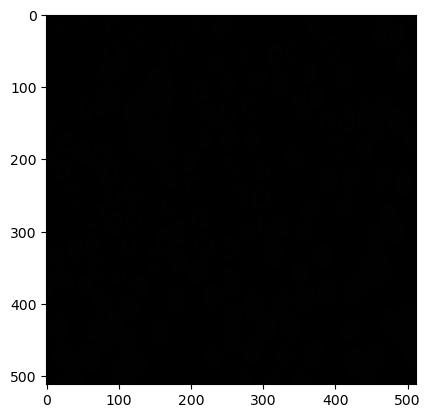

SystemExit: 

/home/moha/miniconda3/envs/Env1/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3534: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [3]:
# %load tp_morpho.py
#!/usr/bin/env python3
"""
Created on Tue Sep  4 10:23:50 2018
Modified Oct 2020, Oct 2021, Oct 2023

@author: Said Ladjal,Isabelle Bloch
"""


#%% SECTION 1 -- inclusion of packages


import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage import io as skio
import sys

import skimage.morphology as morpho 
from skimage.segmentation import watershed 
from skimage.draw import line
import skimage.feature as skf
from scipy import ndimage as ndi
from PIL import Image

#%% SECTION 2 -- Useful functions
path="./Images/"

def viewimage(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS 
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee 
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI et MAXI seront mis a 0 et 255 dans l'image resultat
        
    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' ' 
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M

    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1
    
    nomfichier=tempfile.mktemp('TPIMA.png')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def viewimage_color(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS 
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee 
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI(defaut 0) et MAXI (defaut 255) seront mis a 0 et 255 dans l'image resultat
        
    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' ' 
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M
    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1
    
    nomfichier=tempfile.mktemp('TPIMA.pgm')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def strel(forme,taille,angle=45):#form =shape || taille = size
    #size of SE:disk = radius
    #           square = length of each side 3x3 => radius of 1
    """renvoie un element structurant de forme  
     'diamond'  boule de la norme 1 fermee de rayon taille
     'disk'     boule de la norme 2 fermee de rayon taille
     'square'   carre de cote taille (il vaut mieux utiliser taille=impair)
     'line'     segment de langueur taille et d'orientation angle (entre 0 et 180 en degres)
      (Cette fonction n'est pas standard dans python)
    """

    if forme == 'diamond':
        return morpho.diamond(taille)
    if forme == 'disk':
        return morpho.disk(taille)
    if forme == 'square':
        return morpho.square(taille)
    if forme == 'line':
        angle=int(-np.round(angle))
        angle=angle%180
        angle=np.float32(angle)/180.0*np.pi
        x=int(np.round(np.cos(angle)*taille))
        y=int(np.round(np.sin(angle)*taille))
        if x**2+y**2 == 0:
            if abs(np.cos(angle))>abs(np.sin(angle)):
                x=int(np.sign(np.cos(angle)))
                y=0
            else:
                y=int(np.sign(np.sin(angle)))
                x=0
        rr,cc=line(0,0,y,x)
        rr=rr-rr.min()
        cc=cc-cc.min()
        img=np.zeros((rr.max()+1,cc.max()+1) )
        img[rr,cc]=1
        return img
    raise RuntimeError('Erreur dans fonction strel: forme incomprise')

            

def couleurs_alea(im):
    """ 
    Donne des couleurs aleatoires a une image en niveau de gris.
    Cette fonction est utile lorsque le niveua de gris d'interprete comme un numero
      de region. Ou encore pour voir les leger degrades d'une teinte de gris.
      """
    sh=im.shape
    out=np.zeros((sh[0],sh[1],3),dtype=np.uint8)
    nbcoul=np.int32(im.max())
    tabcoul=np.random.randint(0,256,size=(nbcoul+1,3))
    tabcoul[0,:]=0
    for k in range(sh[0]):
        for l in range(sh[1]):
            out[k,l,:]=tabcoul[im[k,l]]
    return out

def gris_depuis_couleur(im):
    """ Transforme une image couleur en image a niveaux de gris"""
    return im[:,:,:3].sum(axis=2)/3
    
#%% SECTION 3 -- Examples of functions for this work

# Binary images 
im=skio.imread(path+'cellbin.bmp')
#im=skio.imread('cafe.bmp')

# Gray-scale images
#im=skio.imread(path+'retina2.gif')
#im=skio.imread('bat200.bmp')
#im=skio.imread('bulles.bmp')
#im=gris_depuis_couleur (skio.imread('cailloux.png'))
#im=gris_depuis_couleur(skio.imread('cailloux2.png'))
#im=skio.imread('laiton.bmp')

plt.imshow(im,cmap="gray",vmin=0, vmax=255)
#viewimage(im) #- Utilisable à la place de plt.imshow si Gimp est installé.

se=strel('square',4)

# dilation
dil=morpho.dilation(im,se)
plt.imshow(dil,cmap="gray",vmin=0, vmax=255)
plt.show()
sys.exit()

# erosion
ero=morpho.erosion(im,se)
plt.imshow(ero,cmap="gray",vmin=0, vmax=255)
#plt.show()
#opening
open=morpho.opening(im,se)
plt.imshow(open,cmap="gray",vmin=0, vmax=255)
#plt.show()
#closing
close=morpho.closing(im,se)
plt.imshow(close,cmap="gray",vmin=0, vmax=255)
#plt.show()                      
#%% Top-hat transforme
im=skio.imread(path+'retina2.gif')
t=10
se=strel('line',t,-45)
ch=im-morpho.opening(im,se)
plt.imshow(ch,cmap="gray",vmin=0, vmax=255)
#plt.show()
#%%  Alternate sequential filter
im=skio.imread(path+'retina2.gif')
imt=im.copy()
N=3
for k in range(N):
    se=strel('disk',k)
    imt=morpho.closing(morpho.opening(imt,se),se)
plt.imshow(imt,cmap="gray",vmin=0, vmax=255)
plt.show()

sys.exit()
#%% Watersheds
im=skio.imread(path+'bat200.bmp')
im= np.array(Image.open(path+'bat200.bmp'))
print(im.shape)
se=morpho.disk(1)

grad=morpho.dilation(im,se)-morpho.erosion(im,se)
grad=np.int32(grad>40)*grad
plt.imshow(grad,cmap="gray")

local_mini = skf.peak_local_max(255-grad, #il n'y a pas de fonction local_min...
                            indices=False)
markers = ndi.label(local_mini)[0]
plt.imshow(local_mini,cmap="gray")

labels = watershed(grad, markers,watershed_line=True)
plt.imshow(couleurs_alea(labels))
# viewimage_color(couleurs_alea(labels)) - Utilisable si gimp est installé

# visualization of the result
segm=labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j]=255
        else:
            segm[i,j]=0
#superimposition of segmentation contours on the original image
contourSup=np.maximum(segm,im)
plt.imshow(contourSup,cmap="gray") 


#%% reconstruction
im=skio.imread(path+'retina2.gif')
se4=strel('disk',4)
open4=morpho.opening(im,se4)
reco=morpho.reconstruction(open4,im)
plt.imshow(reco,cmap="gray")
#%% FIN  exemples TP MORPHO


In [26]:
def niceDisplay14_bis(affichages,titres=None):
    """ list[Array]*list[str] -> NoneType
        display from 1 up to 4 images or vectors with optionnal titles
        2D arrays are displayed as image with imshow()
        1D arrays are displayed as curve with plot()
    """
    
    if not type(affichages) == type([]):
        affichages = [affichages]
        
    if titres is None:
        titres = ['',]*len(affichages)
        
    if not type(titres) == type([]):
        titres = [titres]
    
    nb_affichages = len(affichages)
    if nb_affichages >5 or nb_affichages < 1 :
        raise ValueError('niceDisplay_14 : affichage should be a list of length 1 up to 4')
        
    if nb_affichages != len(titres):
        raise ValueError('niceDisplay_14 : titres must have same length than affichage')
    plt.gray()
    fig , ax = plt.subplots(1,nb_affichages)
    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    for i in range(0,nb_affichages):
        ax[i].imshow(affichages[i])
        ax[i].set_title(titres[i])

    plt.show()

---
# 1) Mathematical morphology on gray-scale images
---

**1. Answer**
- Dilation and erosion - Using a larger structuring element tends to spread out or expand bright regions (for dilation) or dark regions (for erosion). The shape of the structuring element controls the directionality of this spreading. For example, a vertical structuring element will cause more spreading in the vertical direction.
- Opening and closing - Using a larger structuring element for opening tends to smooth boundaries and break thin connections between bright regions. Using a larger element for closing tends to fuse nearby bright regions together and fill in small dark holes. The shape controls the orientation of the smoothing/fusing.
- In general, the size of the structuring element controls the scale of the morphological effect. Larger elements have more global effects while smaller ones operate locally.
- The shape of the structuring element determines the geometrical nature of the effect. For example, a disk-shaped element causes isotropic (direction-independent) smoothing, while an elongated element preferentially smoothes along its long axis direction.

<Figure size 640x480 with 0 Axes>

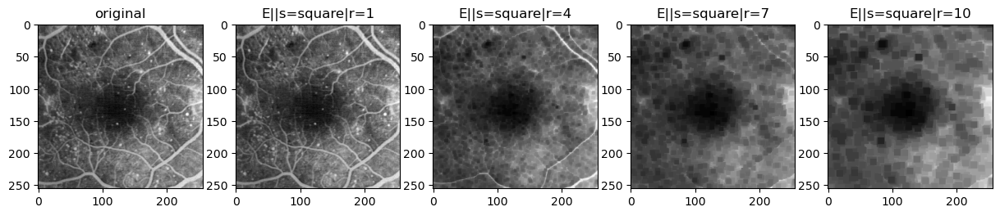

<Figure size 640x480 with 0 Axes>

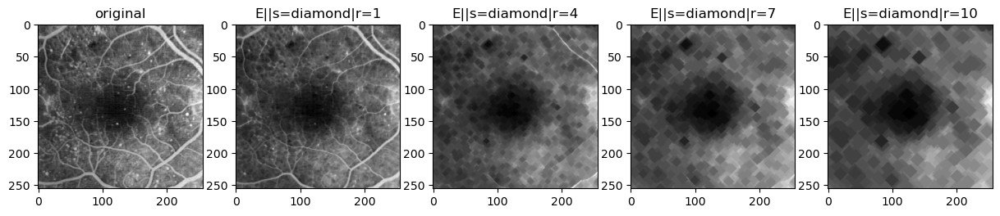

<Figure size 640x480 with 0 Axes>

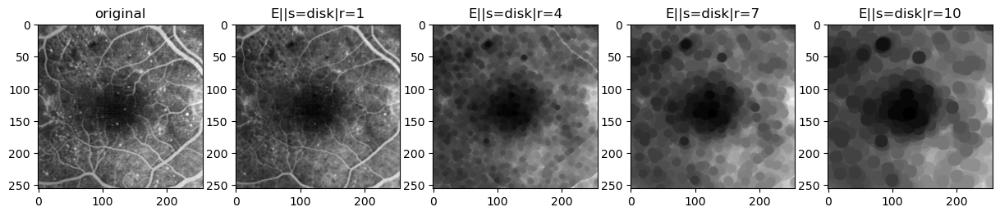

<Figure size 640x480 with 0 Axes>

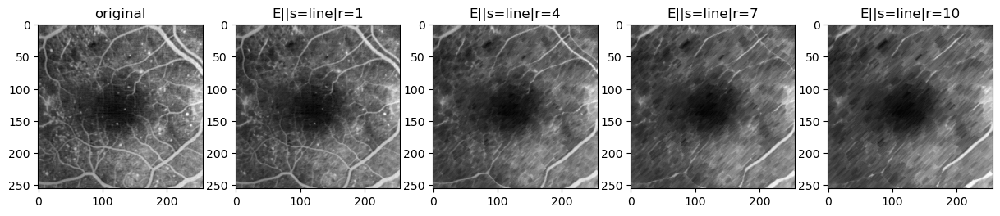

'dil=morpho.opening(im,se)\nplt.imshow(dil,cmap="gray",vmin=0, vmax=255)\nplt.show()'

In [8]:
#Erosion (expand dark regions)
im=np.array(Image.open(path+'retina2.gif'))

se=strel('square',4)
affi=[np.array(im)]
tit=["original"]
for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        dil=morpho.erosion(im,se)
        tit.append(f"E||s={s}|r={r}")
        affi.append(np.array(dil))
    niceDisplay14_bis(affi,tit)
# dilation
"""dil=morpho.opening(im,se)
plt.imshow(dil,cmap="gray",vmin=0, vmax=255)
plt.show()"""

<Figure size 640x480 with 0 Axes>

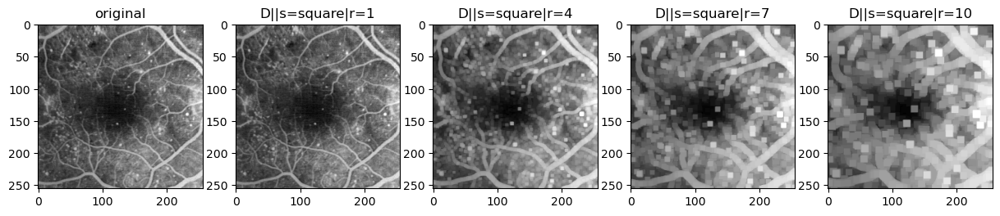

<Figure size 640x480 with 0 Axes>

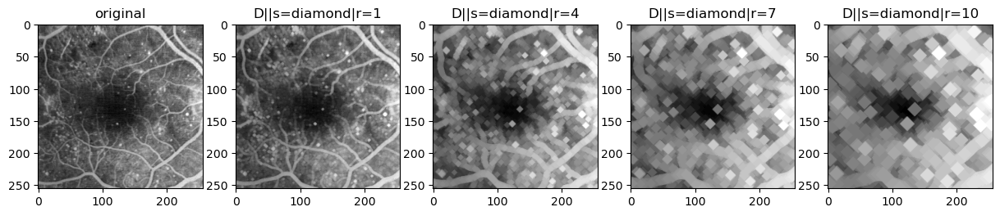

<Figure size 640x480 with 0 Axes>

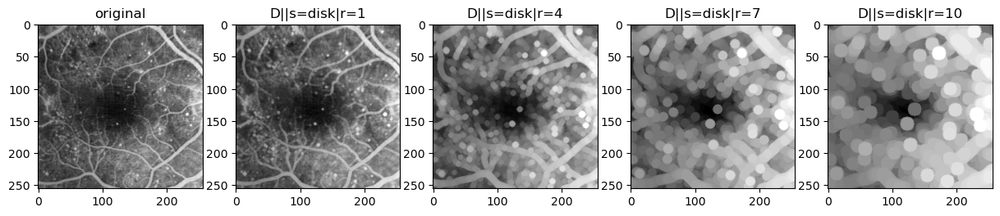

<Figure size 640x480 with 0 Axes>

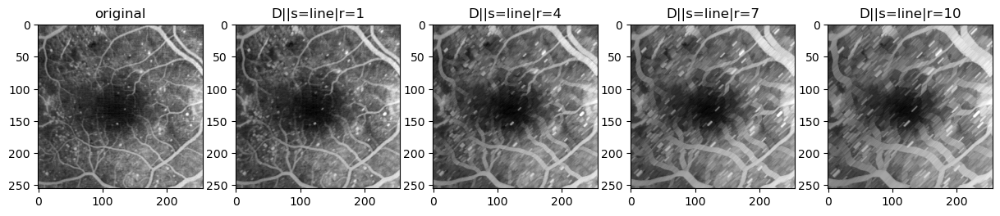

'dil=morpho.opening(im,se)\nplt.imshow(dil,cmap="gray",vmin=0, vmax=255)\nplt.show()'

In [5]:
# Dilation(expand white regions)
im=np.array(Image.open(path+'retina2.gif'))

for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        dil=morpho.dilation(im,se)
        tit.append(f"D||s={s}|r={r}")
        affi.append(np.array(dil))
    niceDisplay14_bis(affi,tit)

<Figure size 640x480 with 0 Axes>

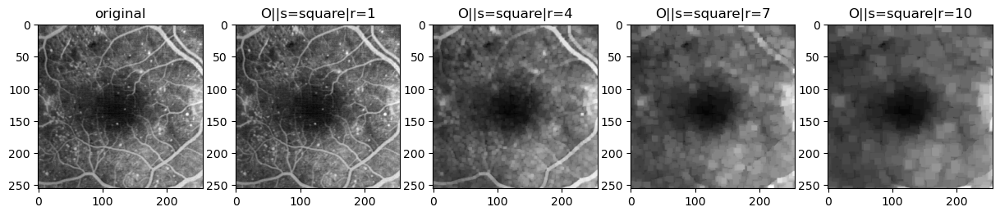

<Figure size 640x480 with 0 Axes>

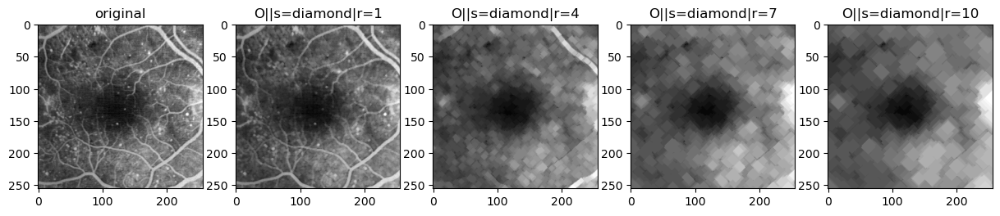

<Figure size 640x480 with 0 Axes>

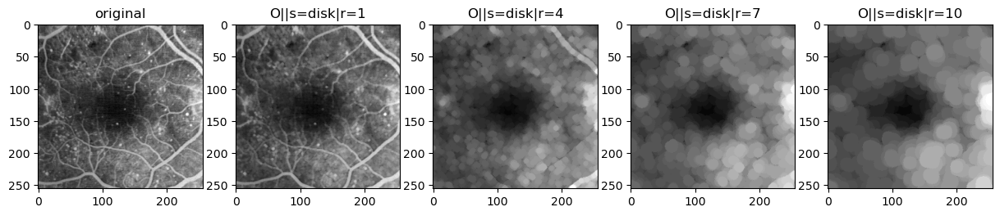

<Figure size 640x480 with 0 Axes>

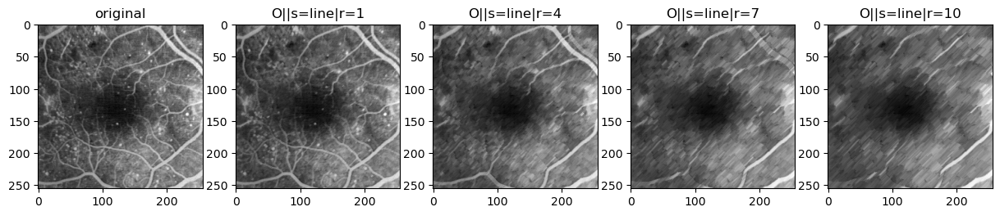

In [9]:
# Opening(smooth boundaries and break thin connections for bright regions)
im=np.array(Image.open(path+'retina2.gif'))

for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        dil=morpho.opening(im,se)
        tit.append(f"O||s={s}|r={r}")
        affi.append(np.array(dil))
    niceDisplay14_bis(affi,tit)

<Figure size 640x480 with 0 Axes>

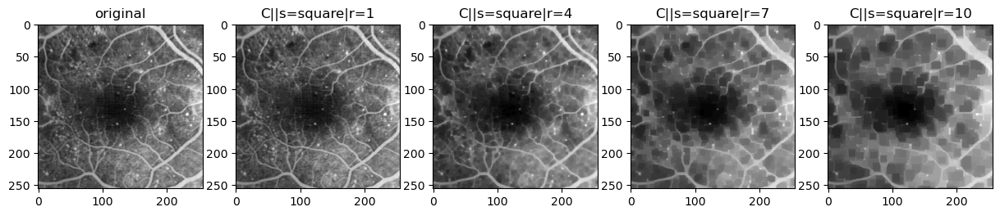

<Figure size 640x480 with 0 Axes>

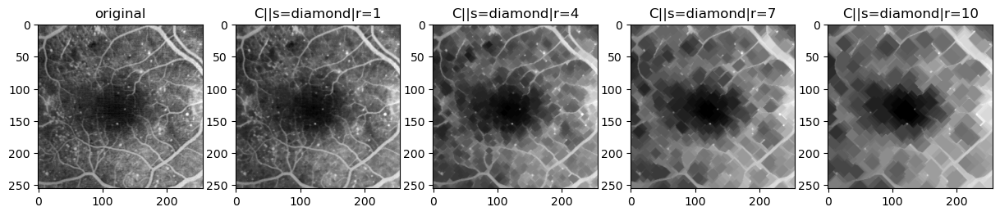

<Figure size 640x480 with 0 Axes>

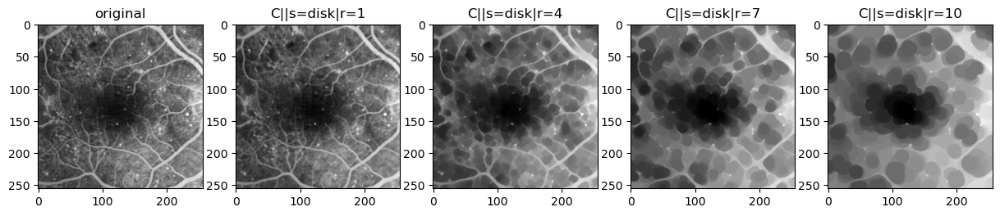

<Figure size 640x480 with 0 Axes>

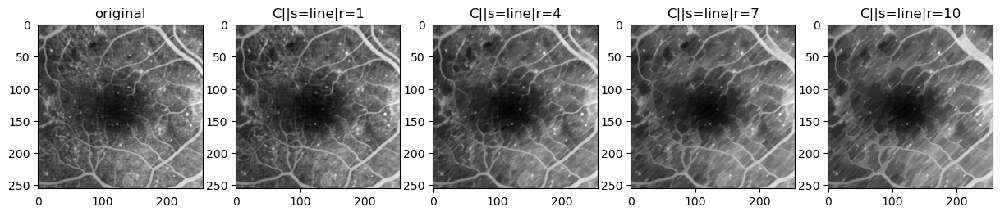

In [11]:
# Closing(fuse nearby bright regions together and fill in small dark holes.)
im=np.array(Image.open(path+'retina2.gif'))

for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        dil=morpho.closing(im,se)
        tit.append(f"C||s={s}|r={r}")
        affi.append(np.array(dil))
    niceDisplay14_bis(affi,tit)

**1.2 Properties**

Below we illustrate the following properties of morhpological operations :
 - Increasing 
 - exsentivity
 - Duality
 - Idempotent

**Increasing**

<Figure size 640x480 with 0 Axes>

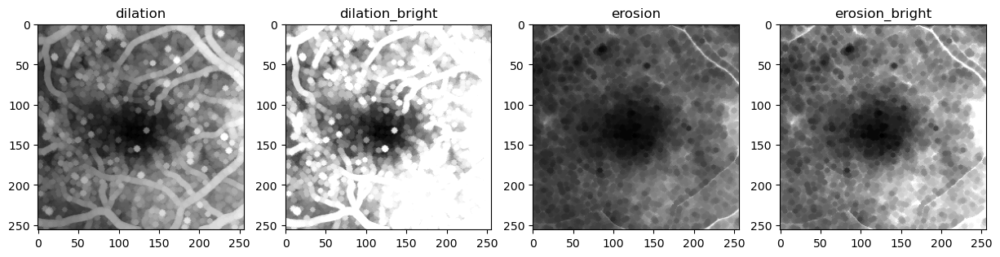

<Figure size 640x480 with 0 Axes>

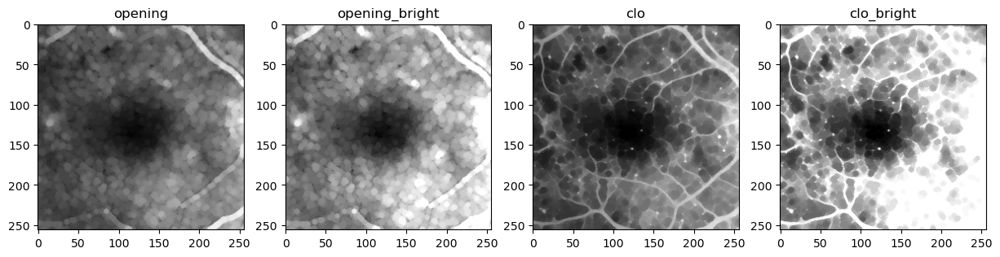

Dilation is increasing
Erosion is increasing
Opening is increasing
Closing is increasing


In [50]:
#Incresing

s='disk'
r=3
se=strel(s,r)
im=np.array(Image.open(path+'retina2.gif'))
dil=morpho.dilation(im,se)
ero= morpho.erosion(im,se)
ope= morpho.opening(im,se)
clo= morpho.closing(im,se)
value=100
mask = (255 - im) < value
grey_new = np.where((255 - im) < value,255,im+value)

dil_bright=morpho.dilation(grey_new,se)
ero_bright= morpho.erosion(grey_new,se)
ope_bright= morpho.opening(grey_new,se)
clo_bright= morpho.closing(grey_new,se)
tit=['dilation','dilation_bright','erosion','erosion_bright']
affi=[dil,dil_bright,ero,ero_bright]
niceDisplay14_bis(affi,tit)
tit=['opening','opening_bright','clo','clo_bright']
affi=[ope,ope_bright,clo,clo_bright]
niceDisplay14_bis(affi,tit)
if (dil_bright > dil).all():
  print("Dilation is increasing")
else:
  print("Dilation is NOT increasing")
if (ero_bright > ero).all():
  print("Erosion is increasing")
else:
  print("Erosion is NOT increasing")
if (ope_bright > ope).all():
  print("Opening is increasing")
else:
  print("Opening is NOT increasing")
if (clo_bright > clo).all():
  print("Closing is increasing")
else:
  print("Closing is NOT increasing")

**Extensivity**
- $X \ominus B \leq X$ 
- $X \oplus B \geq X$
- $X \circ  B \leq X$
- $X \bullet B \geq X$ 

<Figure size 640x480 with 0 Axes>

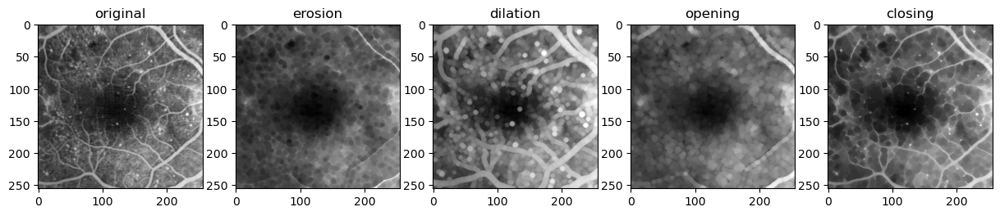

Erosion is Anti-extensive
Dilation is  Extensive
Opening is Anti-extensive
Closing is extensive


In [41]:
#Extensivity

s='disk'
r=3
se=strel(s,r)
im=np.array(Image.open(path+'retina2.gif'))

ero= morpho.erosion(im,se)
dil=morpho.dilation(im,se)
ope= morpho.opening(im,se)
clo= morpho.closing(im,se)

tit=['original','erosion','dilation','opening','closing']
affi=[im,ero,dil,ope,clo]
niceDisplay14_bis(affi,tit)



if (ero <= im).all():
  print("Erosion is Anti-extensive")
if (dil >= im).all():
  print("Dilation is  Extensive")
if (ope <= im).all():
  print("Opening is Anti-extensive")
if (clo >= im).all():
  print("Closing is extensive")


**Duality**

- $(X \ominus B)^c = (X^c \oplus \hat{B})$
- $(X \oplus B )^c= (X^c \ominus \hat{B})$
- $(X \circ B)^c = (X^c \bullet \hat{B})$
- $(X \bullet B)^c = (X^c \circ \hat{B})$

Where $\hat{B}$ is  the symmetrical structuring element.

<Figure size 640x480 with 0 Axes>

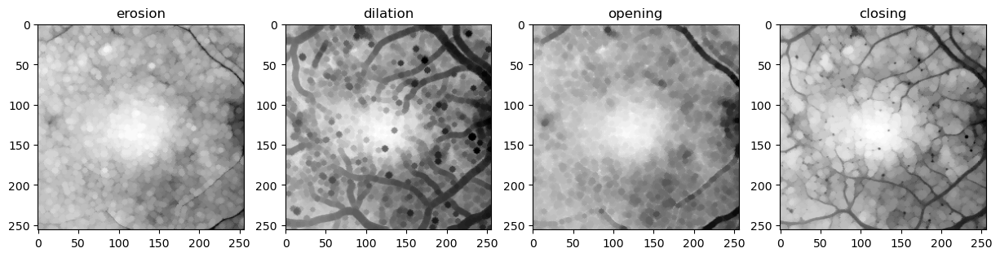

<Figure size 640x480 with 0 Axes>

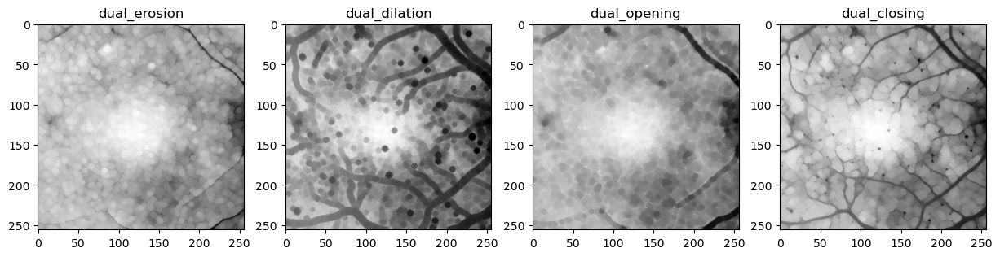

Erosion dual
Dilation dual
Opening dual
Closing dual


In [49]:
#Duality

s='disk'
r=3
se=strel(s,r)
im=np.array(Image.open(path+'retina2.gif'))
inv= 255 -im
ero= 255- morpho.erosion(im,se)
dil= 255- morpho.dilation(im,se)
ope= 255- morpho.opening(im,se)
clo= 255- morpho.closing(im,se)

dual_ero=  morpho.dilation(inv,se)
dual_dil=  morpho.erosion(inv,se)
dual_ope=  morpho.closing(inv,se)
dual_clo=  morpho.opening(inv,se)


tit=['erosion','dilation','opening','closing']
affi=[ero,dil,ope,clo]
niceDisplay14_bis(affi,tit)
tit=['dual_erosion','dual_dilation','dual_opening','dual_closing']
affi=[dual_ero,dual_dil,dual_ope,dual_clo]
niceDisplay14_bis(affi,tit)


if (ero == dual_ero).all():
  print("Erosion dual")

if (dil == dual_dil).all():
  print("Dilation dual")

if (ope == dual_ope).all():
  print("Opening dual")
if (clo == dual_clo).all():
  print("Closing dual")

**Idempotent**

Idempotent means that applying the morphological operation $F$ successively to an image $I$ is equivalent to applying only once $F(F(I)) = F(I)$

- Opening and closing  are idempotent
- Erosion and dilation are NOT idempotent


<Figure size 640x480 with 0 Axes>

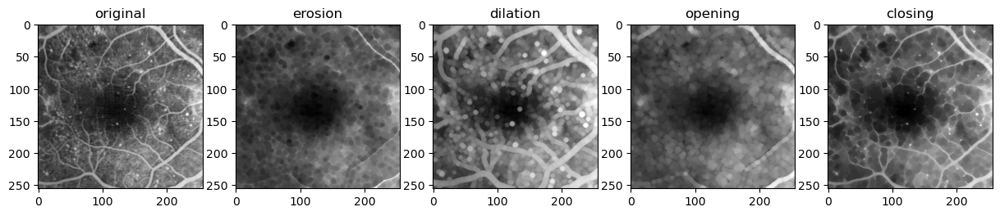

<Figure size 640x480 with 0 Axes>

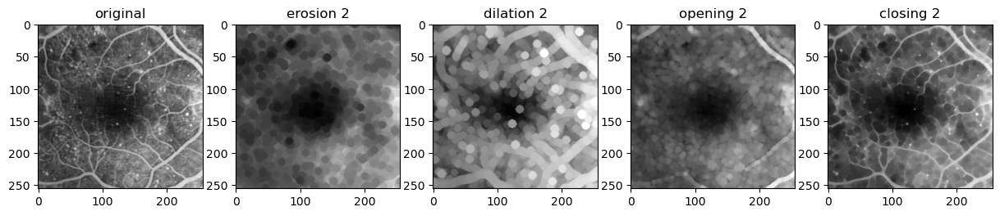

Erosion is NOT Idempotent
Dilation is NOT Idempotent
Opening is Idempotent
Closing is Idempotent


In [44]:
#Idempotent
s='disk'
r=3
se=strel(s,r)
im=np.array(Image.open(path+'retina2.gif'))

ero= morpho.erosion(im,se)
dil=morpho.dilation(im,se)
ope= morpho.opening(im,se)
clo= morpho.closing(im,se)

ero2= morpho.erosion(ero,se)
dil2=morpho.dilation(dil,se)
ope2= morpho.opening(ope,se)
clo2= morpho.closing(clo,se)


tit=['original','erosion','dilation','opening','closing']
affi=[im,ero,dil,ope,clo]
niceDisplay14_bis(affi,tit)
tit=['original','erosion 2','dilation 2','opening 2','closing 2']
affi=[im,ero2,dil2,ope2,clo2]
niceDisplay14_bis(affi,tit)


if (ero == ero2).all():
  print("Erosion is Idempotent")
else:
  print("Erosion is NOT Idempotent")
if (dil == ero2).all():
  print("Dilation is  Idempotent")
else:
  print("Dilation is NOT Idempotent")
if (ope == ope2).all():
  print("Opening is Idempotent")
if (clo == clo2).all():
  print("Closing is Idempotent")

**1.3 Answer**
- Dilation with 3x3 square SE Followed by dilation with 5x5 square SE Is equivalent to:
Dilation with 7x7 square SE.

3x3 and 5x5 SE are of radius 1 and 2 resp. adding them will give us SE of radius 3 which is 7x7. 
$$\text{property==> }D[D(X,B),B0] = D(X,B \oplus B0)$$
- Opening: it is equivalent to performing opening with the bigger SE here 5x5
 $$\text{property==> }(X_n)_{n \prime} = X_{max(n,n\prime)}$$

In [37]:
im=np.array(Image.open(path+'retina2.gif'))
s= "square"
dil1=morpho.dilation(morpho.dilation(im,strel(s,3)),strel(s,5))
dil2=morpho.dilation(im,strel(s,7))
mse = np.mean((dil2 - dil1) ** 2)
if mse == 0:
    print("The images are the same.")
else:
    print("The images are different.")
open1=morpho.opening(morpho.opening(im,strel(s,3)),strel(s,5))
open2=morpho.opening(im,strel(s,5))
mse = np.mean((open1 - open2) ** 2)
if mse == 0:
    print("The images are the same.")
else:
    print("The images are different.")


The images are the same.
The images are the same.


**1.4 Answer**

**A**
- A larger structuring element will cause larger bright features to be removed by the opening. So these features will be highlighted in the resulting image.
- The shape of the structuring element affects the geometry of features that are extracted. For example, a disk-shaped structuring element will tend to extract roundish features, while a square element will tend to extract square-like features.

**B**

The dual operation to the top-hat transform is the bottom-hat transform.
The bottom-hat transform is defined as:
- Bottom-hat =  Closing - Original image

The Closing fills in dark gaps and holes that are smaller than the structuring element. Subtracting the original image then highlights just these small dark details.


<Figure size 640x480 with 0 Axes>

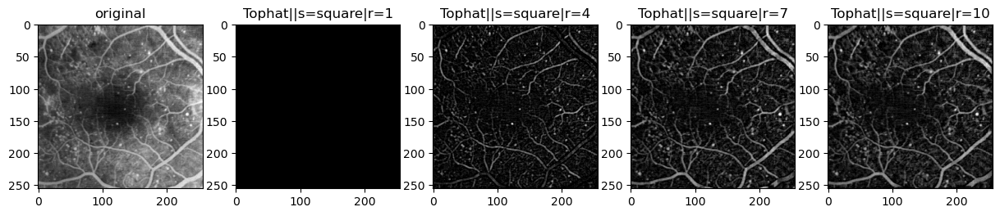

<Figure size 640x480 with 0 Axes>

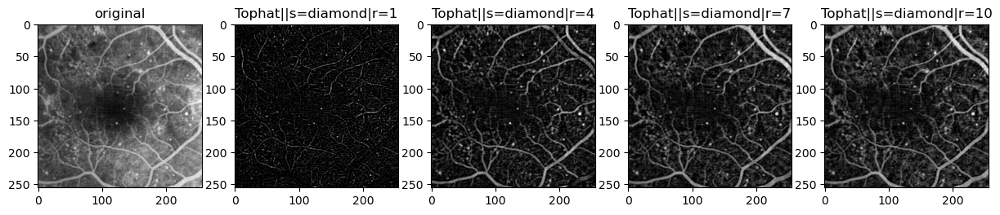

<Figure size 640x480 with 0 Axes>

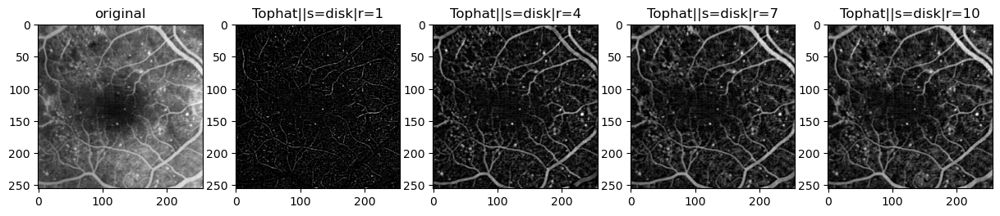

<Figure size 640x480 with 0 Axes>

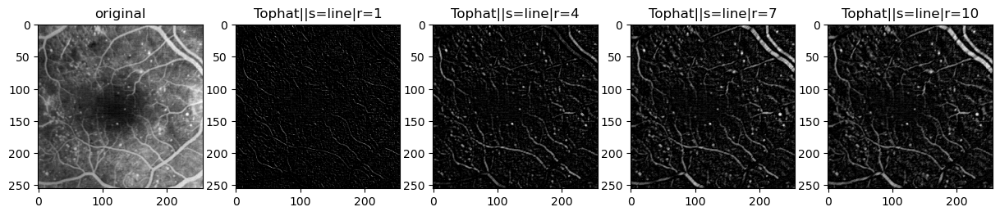

In [41]:
#Detection white lines
im=np.array(Image.open(path+'retina2.gif'))

affi=[np.array(im)]
tit=["original"]
for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        op=morpho.opening(im,se)
        TopHat=im-op
        tit.append(f"Tophat||s={s}|r={r}")
        affi.append(np.array(TopHat))
    niceDisplay14_bis(affi,tit)


<Figure size 640x480 with 0 Axes>

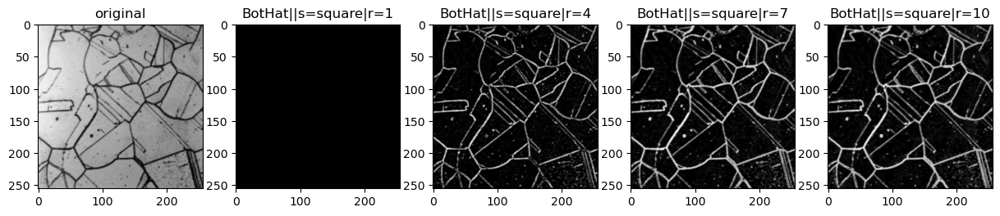

<Figure size 640x480 with 0 Axes>

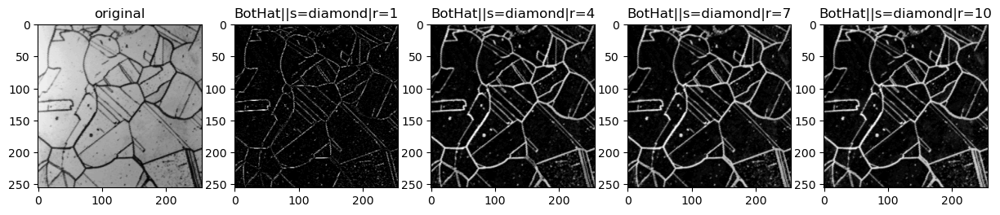

<Figure size 640x480 with 0 Axes>

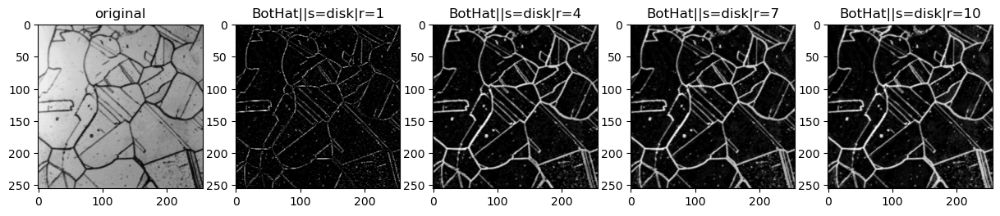

<Figure size 640x480 with 0 Axes>

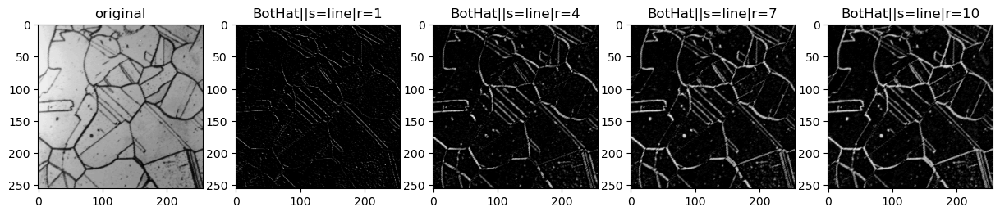

In [38]:
#Detection black lines
im=np.array(Image.open(path+'laiton.bmp'))

affi=[np.array(im)]
tit=["original"]
for s in['square','diamond','disk','line']:
    affi=[np.array(im)]
    tit=["original"]
    for r in [1,4,7,10]:
        se=strel(s,r)
        close=morpho.closing(im,se)
        TopHat=close-im
        tit.append(f"BotHat||s={s}|r={r}")
        affi.append(np.array(TopHat))
    niceDisplay14_bis(affi,tit)

**1.5 Answer**

The opening  will remove small objects and smooth boundaries in each direction. Taking the point-wise maximum of these multiple opening results retains the maximum opening effect in all directions.

As seen in the figure below the small white areas are all removed and the resulting image is smooth.


<Figure size 640x480 with 0 Axes>

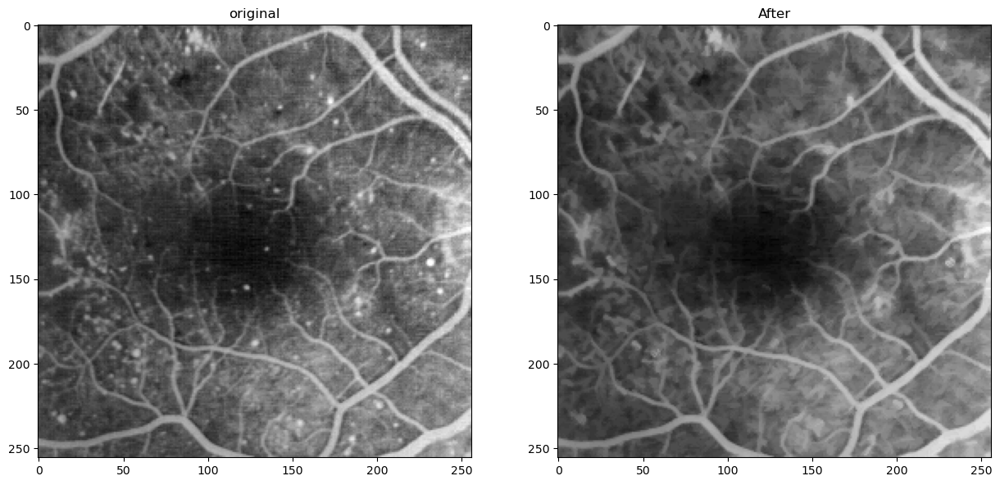

In [61]:
im=np.array(Image.open(path+'retina2.gif'))

affi=[im]
tit=["original"]
image_max=np.zeros(im.shape)
l= np.arange(0,365,5)
s="line"
r=5
for ang in l:
    se=strel(s,r,ang)
    op=morpho.opening(im,se)
    image_max = np.maximum(image_max, op)
affi.append(image_max)
tit.append("After")
niceDisplay14_bis(affi,tit)

---
# 2) Alternate sequential filters
---

**2.1 Answer**
- The effect is that it will smooth and simplify the image, removing small details and noise while preserving larger scale structures. The larger the structuring elements, the more simplified the image becomes with minimal details.

- The structuring element becomes more  apparent in the image as we do more iterations .

- A Very large structuring elements will essentially deform the image as seen in the images below with 60 as maximum size for SE.

<Figure size 640x480 with 0 Axes>

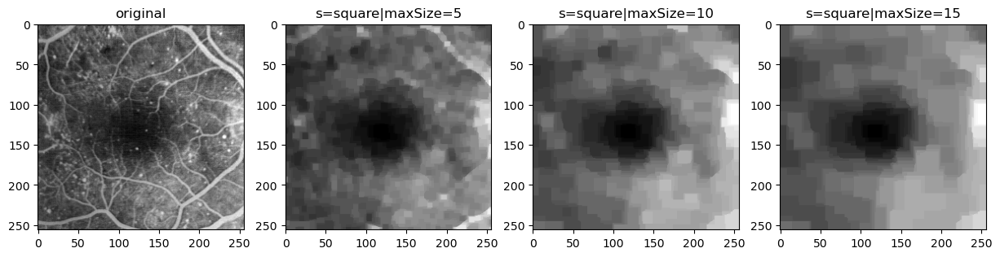

<Figure size 640x480 with 0 Axes>

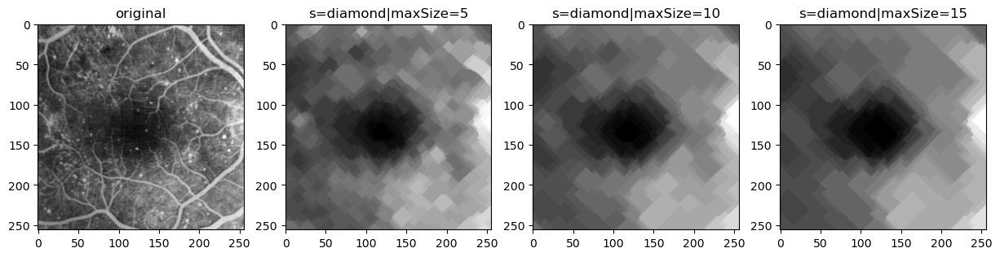

<Figure size 640x480 with 0 Axes>

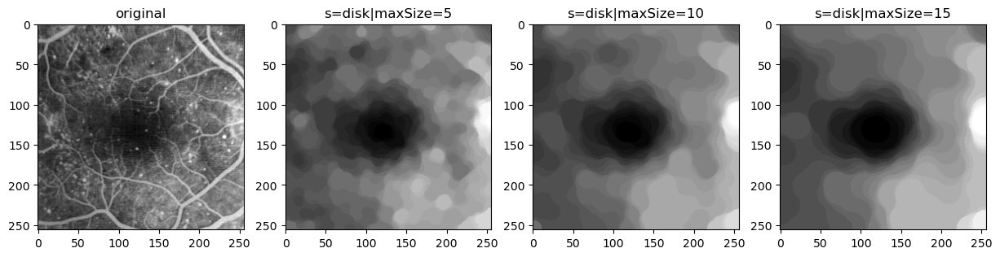

<Figure size 640x480 with 0 Axes>

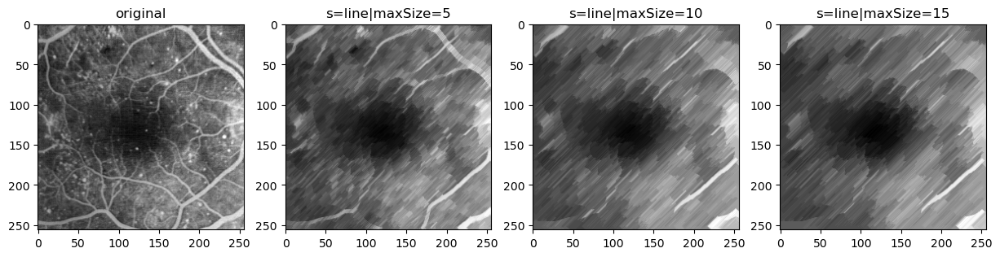

In [88]:
for s in ['square','diamond','disk','line']:
    fas=np.array(Image.open(path+'retina2.gif'))
    affi=[fas]
    tit=["original"]
    sizes= np.arange(1,21,1)
    seL = [ strel( s ,i ) for i in sizes ]
    for i,se in enumerate(seL):
        fas=morpho.closing(morpho.opening(fas,se),se)
        if not (i%5):
            if i==0:continue
            affi.append(fas)
            tit.append(f"s={s}|maxSize={i}")

    niceDisplay14_bis(affi,tit)

<Figure size 640x480 with 0 Axes>

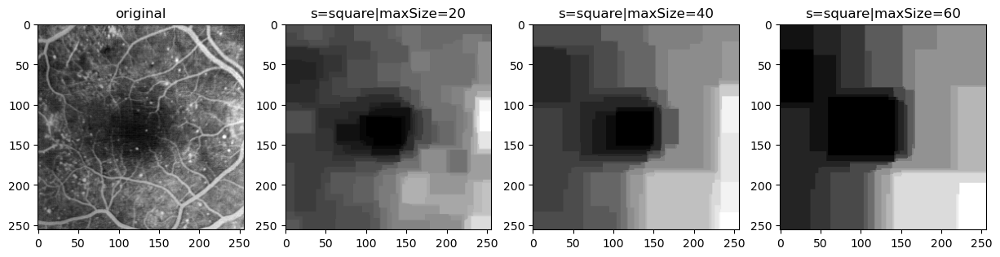

<Figure size 640x480 with 0 Axes>

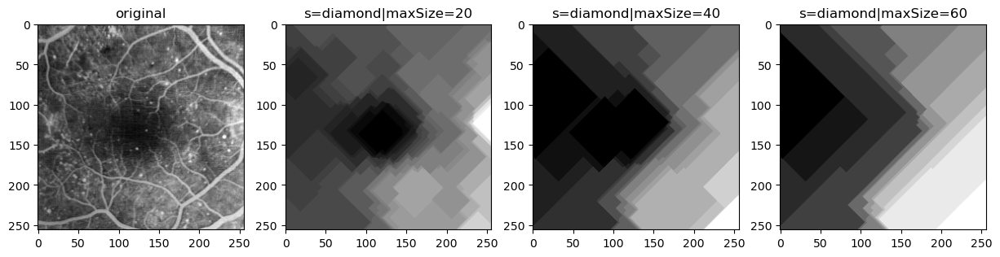

<Figure size 640x480 with 0 Axes>

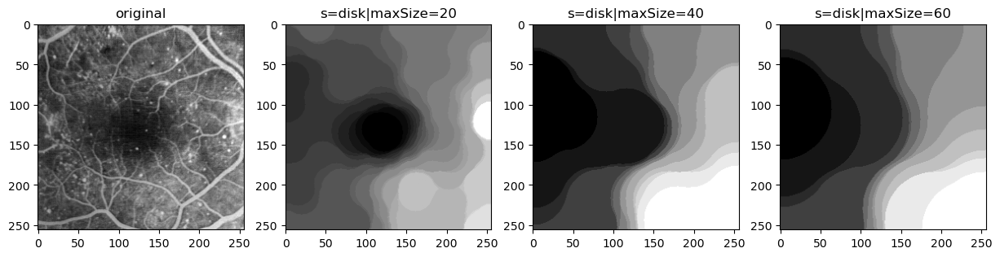

<Figure size 640x480 with 0 Axes>

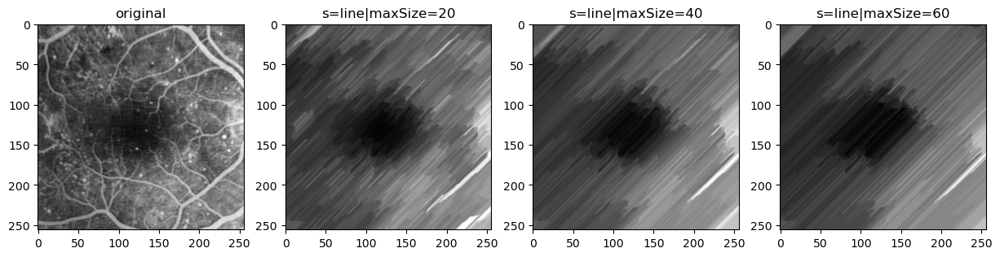

In [98]:
for s in ['square','diamond','disk','line']:
    fas=np.array(Image.open(path+'retina2.gif'))
    affi=[fas]
    tit=["original"]
    sizes= np.arange(1,62,20)
    seL = [ strel( s ,i ) for i in sizes ]
    for i,se in enumerate(seL):
        fas=morpho.closing(morpho.opening(fas,se),se)
        if True:
            if i==0:continue
            affi.append(fas)
            tit.append(f"s={s}|maxSize={20*i}")

    niceDisplay14_bis(affi,tit)

---
# 3) Reconstruction
---

**3.1 Answer**

The opening removes small bright areas from the image, and also causes a loss of information from the original image as we can see the image becomes blurred. Reconstruction makes it possible to recover this lost information without retrieving the bright areas.

Also, depending on the size and the type of SE we might lose a lot of information on the opening which will result in a bad reconstruction.

<Figure size 640x480 with 0 Axes>

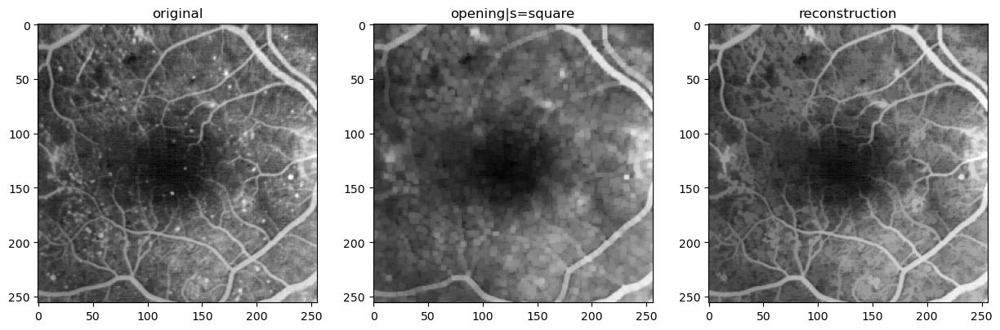

<Figure size 640x480 with 0 Axes>

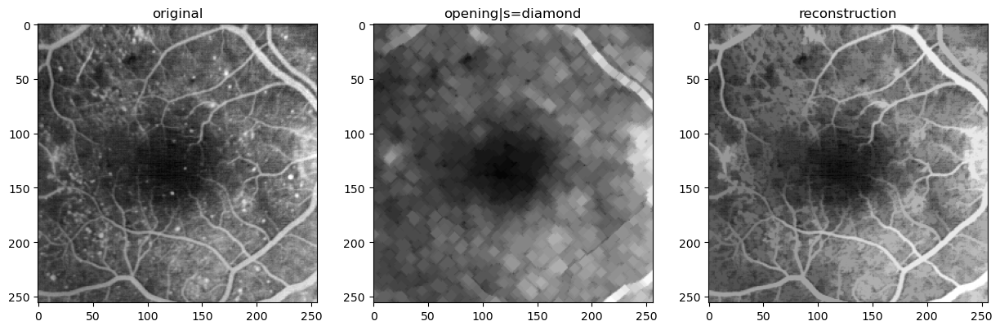

<Figure size 640x480 with 0 Axes>

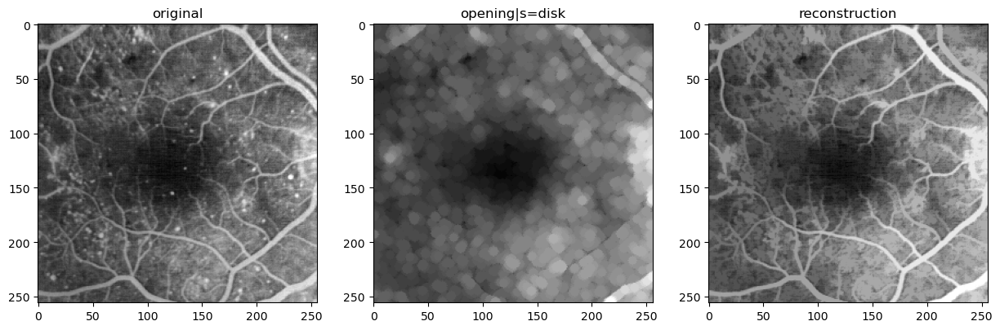

<Figure size 640x480 with 0 Axes>

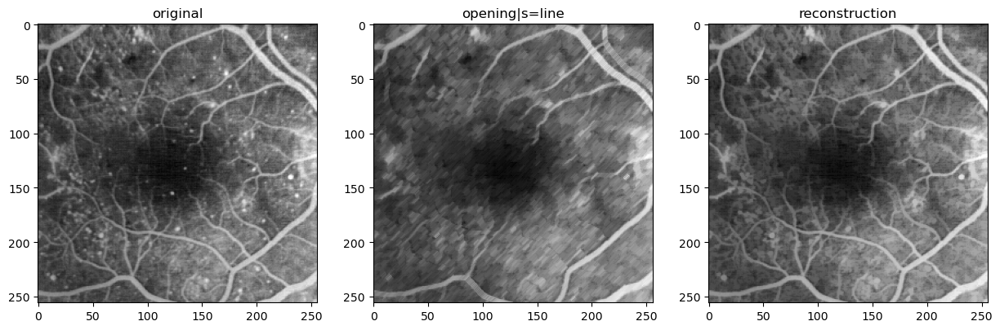

In [119]:
im=skio.imread(path+'retina2.gif')
for s in ['square','diamond','disk','line']:
    se4 = strel(s,4)
    open4 = morpho.opening(im,se4)
    reco=morpho.reconstruction(open4,im)
    niceDisplay14_bis([im,open4,reco],['original',f'opening|s={s}','reconstruction'])

**3.2 Answer**

To derived this recostruction by duality principle from a reconstruction by dilation. We have to:
- Inverse the image.
- Do a morphological opening.
- Reconstruct the image by dilation.
- Inverse the reconstruction.

The reconstructions are the same.


<Figure size 640x480 with 0 Axes>

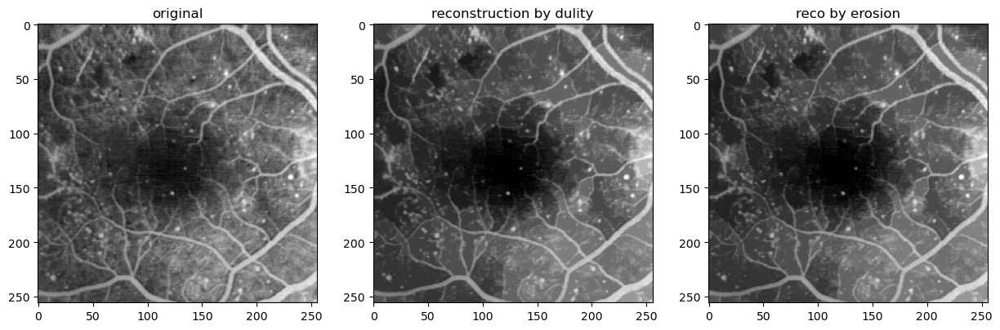

In [125]:
#By duality
im=skio.imread(path+'retina2.gif')
inv=255-im
se4 = strel('diamond',4)
open4 = morpho.opening(inv,se4)
reco=255-morpho.reconstruction(open4,inv)
#By erosion
open2 = morpho.closing(im,se4)
reco2=morpho.reconstruction(open2,im,method='erosion')
mse = np.mean((reco - reco2) ** 2)
if mse == 0:
    print("The reconstructions are the same.")
else:
    print("The reconstructions are different.")
niceDisplay14_bis([im,reco,reco2],['original','reconstruction by dulity','reco by erosion'])

**3.3 Answer**

The resulting image have lost a lot of details and information. However, the image is still recognizable, compared to using alternate sequential filters without reconstruction as seen in section 2.

<Figure size 640x480 with 0 Axes>

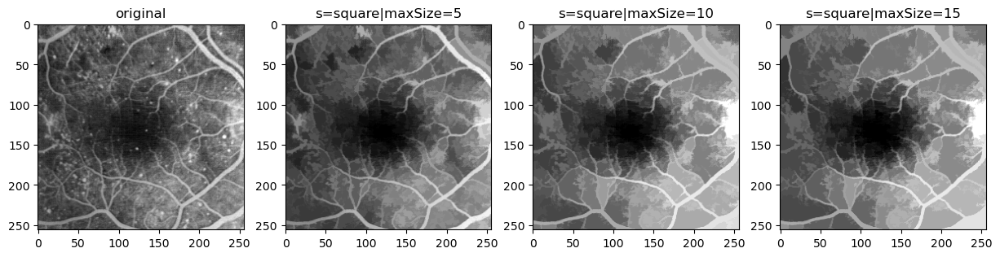

<Figure size 640x480 with 0 Axes>

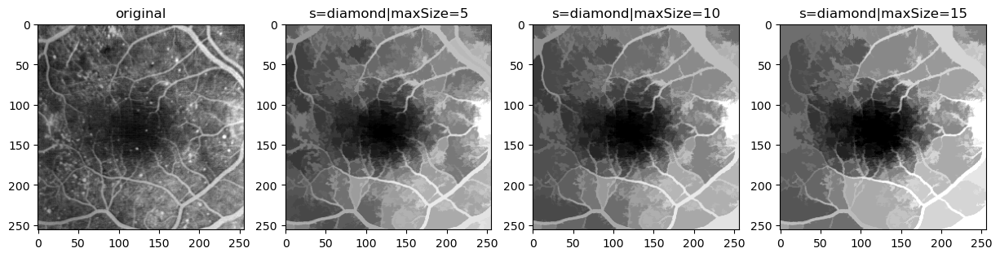

<Figure size 640x480 with 0 Axes>

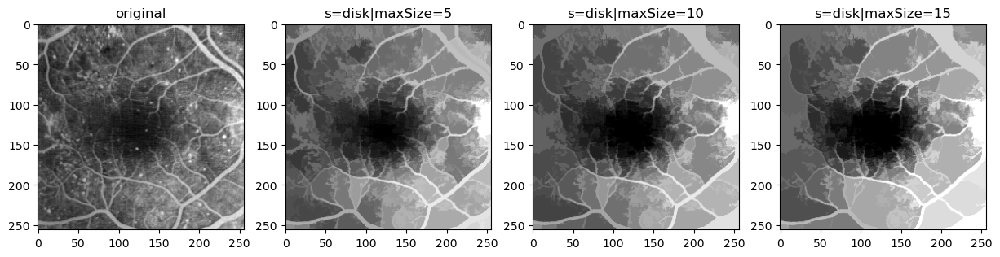

In [128]:
for s in ['square','diamond','disk']:
    fas=np.array(Image.open(path+'retina2.gif'))
    affi=[fas]
    tit=["original"]
    sizes= np.arange(1,21,1)
    seL = [ strel( s ,i ) for i in sizes ]
    for i,se in enumerate(seL):
        open=morpho.opening(fas,se)
        reco_op=morpho.reconstruction(open,fas)
        fas=morpho.closing(reco_op,se)
        fas=morpho.reconstruction(fas,reco_op,method='erosion')
        if not (i%5):
            if i==0:continue
            affi.append(fas)
            tit.append(f"s={s}|maxSize={i}")

    niceDisplay14_bis(affi,tit)

---
# 4) Segmentation
---

**4.1 Answer**

Dilation expands bright regions and shrink dark regions in an image. Erosion does the opposite - it shrinks bright regions and expands dark ones.
When we subtract eroded image from dilated, it gives us the difference between the two which is the edges between bright and dark regions.

We can see also that the gradient obtained with SE='line' is not as good as other SE, that because lines will detect edges oriented perpendicular to the line. So, a vertical line SE will be sensitive to horizontal edges as shown below. Lines are good for picking up edges in a specific direction.

The other SE are isotropic, they will pick up edges in all directions


<Figure size 640x480 with 0 Axes>

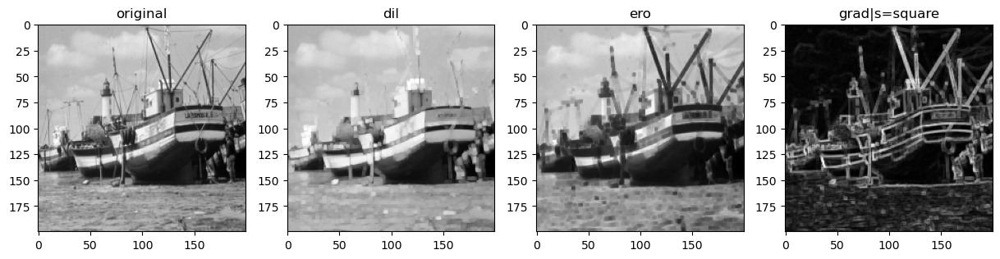

<Figure size 640x480 with 0 Axes>

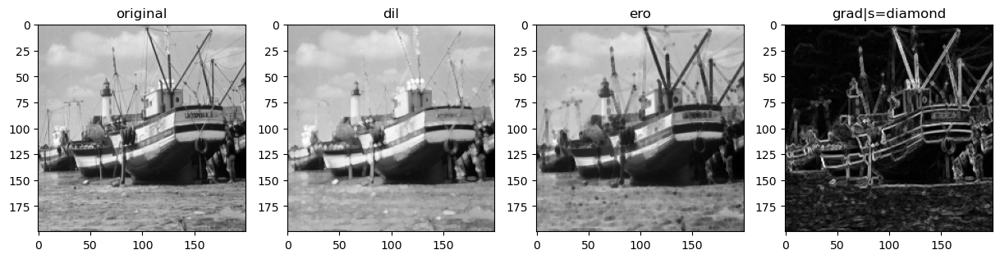

<Figure size 640x480 with 0 Axes>

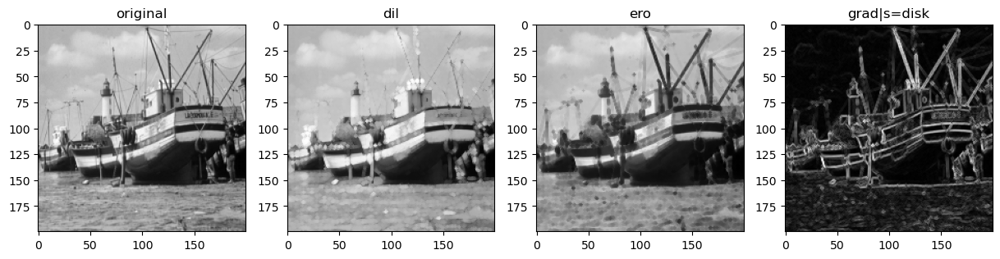

<Figure size 640x480 with 0 Axes>

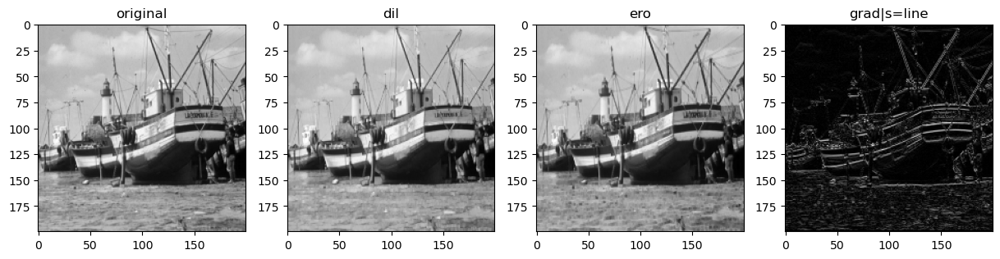

In [136]:
for s in ['square','diamond','disk','line']:
    fas=np.array(Image.open(path+'bat200.bmp'))
    affi=[fas]
    tit=["original"]
    se=strel(s,1)
    if s =='square':
        se=strel(s,3)
    if s =='line':
        se=strel(s,1,90)

    dil=morpho.dilation(fas,se)
    affi.append(dil)
    tit.append("dil")
    ero=morpho.erosion(fas,se)
    affi.append(ero)
    tit.append("ero")
    grad= dil -ero
    affi.append(grad)
    tit.append(f"grad|s={s}")
    niceDisplay14_bis(affi,tit)

**4.2 Answer**

The segmentation results need improvement. For example, portions of the boat are incorrectly segmented as sky. Additionally, there are many small, incorrectly segmented regions for example the sea.

(200, 200)


/tmp/ipykernel_185418/2079428920.py:10: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...


<Figure size 640x480 with 0 Axes>

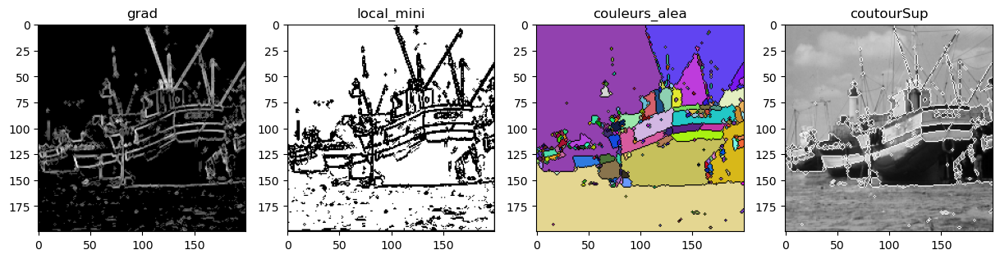

In [7]:
im=skio.imread(path+'bat200.bmp')
im= np.array(Image.open(path+'bat200.bmp'))
se=morpho.disk(1)

grad=morpho.dilation(im,se)-morpho.erosion(im,se)
grad=np.int32(grad>40)*grad
#plt.imshow(grad,cmap="gray")

local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...
markers = ndi.label(local_mini)[0]
#plt.imshow(local_mini,cmap="gray")

labels = watershed(grad, markers,watershed_line=True)
#plt.imshow(couleurs_alea(labels))
# visualization of the result
segm=labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0: 
            segm[i,j]=255
        else:
            segm[i,j]=0
#superimposition of segmentation contours on the original image
contourSup=np.maximum(segm,im)
niceDisplay14_bis([grad,local_mini,couleurs_alea(labels),contourSup],['grad','local_mini','couleurs_alea','coutourSup'])

**4.3 Answer**

Applying a morphological closing operation on the gradient image will fill in small gaps. This will smooth the gradients. As shown below we managed to get rid of some over segmentation of the bottom part of the image.

Reconstruction by dilation, will tend to flatten peak intensities while preserving edges. This will remove small intensity variations while preserving the overall contours.

Applying both at the same time, will combine their individual results. 

The segmentation did not improve that much, we are still wrongly segmenting part of the boat as a sky.

/tmp/ipykernel_185418/3877327191.py:18: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...


<Figure size 640x480 with 0 Axes>

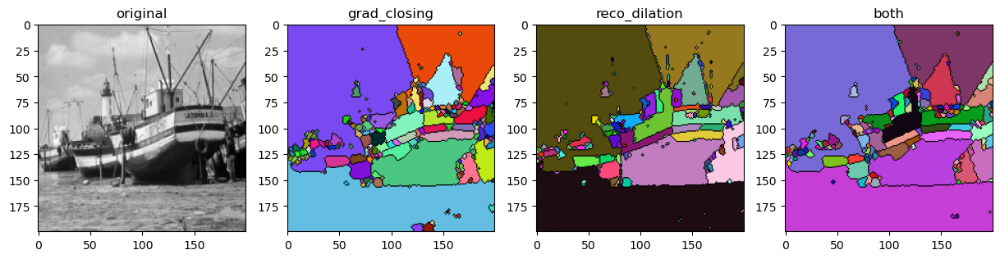

In [16]:
affi=[np.array(Image.open(path+'bat200.bmp'))]
tit =["original"]
for i in ['grad_closing','reco_dilation','both']:
    im= np.array(Image.open(path+'bat200.bmp'))
    if i=='reco_dilation' or i=='both':
        open =morpho.opening(im,morpho.disk(1))
        im=morpho.reconstruction(open,im)

    se=morpho.disk(1)

    grad=morpho.dilation(im,se)-morpho.erosion(im,se)

    grad=np.int32(grad>40)*grad
    #plt.imshow(grad,cmap="gray")
    if i=='grad_closing' or i=='both':
        grad = morpho.closing(grad,morpho.disk(1))

    local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...
    markers = ndi.label(local_mini)[0]
    #plt.imshow(local_mini,cmap="gray")

    labels = watershed(grad, markers,watershed_line=True)
    seg=couleurs_alea(labels)
    affi.append(seg)
    tit.append(i)
niceDisplay14_bis(affi,tit)

**4.4 Answer**

The sequence of operations is:

- Compute the gradient of the image.
- Impose a minimum gradient magnitude threshold on the image. Set pixel values below this threshold to zero.
- Apply the watershed transform on this threshold gradient magnitude image.

The effect of eliminating regional minima is that it will lead to fewer and larger segmented regions from the watershed. Very small areas are merged into larger areas. This prevents over segmentation from the watershed.

However, this can make some meaningful regions may also get eliminated or merged. So, the threshold needs to be carefully selected to suppress only insignificant minima.


/tmp/ipykernel_185418/2463754340.py:15: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...


<Figure size 640x480 with 0 Axes>

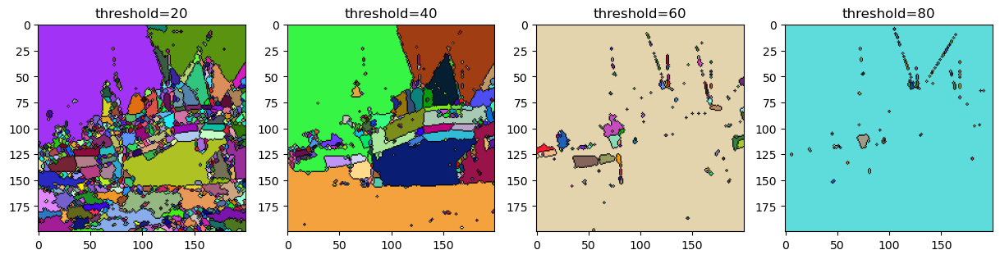

In [18]:
"""affi=[np.array(Image.open(path+'bat200.bmp'))]
tit =["original"]"""
affi=[]
tit=[]
for thres in np.arange(20,90,20):
    im= np.array(Image.open(path+'bat200.bmp'))


    se=morpho.disk(1)

    grad=morpho.dilation(im,se)-morpho.erosion(im,se)

    grad=np.int32(grad>thres)*grad # thresholding

    local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...
    markers = ndi.label(local_mini)[0]

    labels = watershed(grad, markers,watershed_line=True)
    seg=couleurs_alea(labels)
    affi.append(seg)
    tit.append(f"threshold={thres}")
niceDisplay14_bis(affi,tit)

**4.5 Answer**

I used an automatic marker defined below, takes in a gradient of the image and use the predefined function from open cv to identify regional minima as markers. I then sort the markers by area, marks the top markers as 0 (inside), and the rest as 255 (outside) based on area.

we have reduced a lot of small wrongly segmented areas in the resulted segmentation.



In [34]:
import cv2
def auto_marker(gradient, image):
    connectivity=4
    binary_map = (gradient > 0).astype(np.uint8)
    markers = cv2.connectedComponentsWithStats(binary_map, connectivity,cv2.CV_32S)
    num_markers = markers[0]
    marker_stats = markers[2]

    # Sort markers by area (excluding background)
    sorted_markers = sorted(range(1, num_markers), key=lambda x: -marker_stats[x, cv2.CC_STAT_AREA])

    # Create a marker image (m) with the same size as the original image
    marker = np.zeros_like(image, dtype=np.uint8)

    # Mark the top markers as 0 (inside), and the rest as 255 (outside)
    for i in range(1, num_markers):
        if i in sorted_markers[:2]:
            marker[markers[1] == i] = 255  #outmarker
        else:
            marker[markers[1] == i] = 0  # Inside marker
    return marker


/tmp/ipykernel_189310/1101912660.py:31: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_mini = skf.peak_local_max(255-rec,indices=False) #il n'y a pas de fonction local_min...


<Figure size 640x480 with 0 Axes>

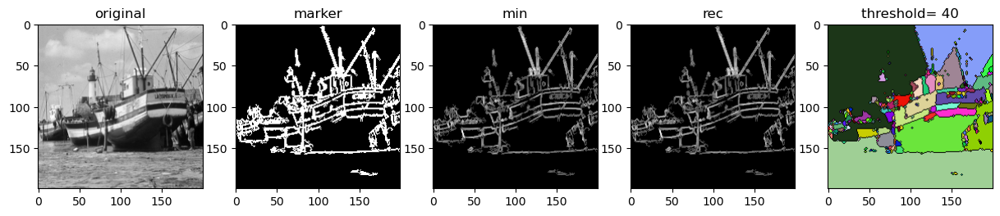

In [35]:
affi=[np.array(Image.open(path+'bat200.bmp'))]
tit =["original"]


im= np.array(Image.open(path+'bat200.bmp'))
se=morpho.disk(1)
grad=morpho.dilation(im,se)-morpho.erosion(im,se)
grad=np.int32(grad>40)*grad # thresholding

"""marker = np.zeros_like(grad, dtype=np.uint8)
marker[grad < 0] = 255"""
"""marker = np.ones_like(im, dtype=np.uint8)
marker=np.where(marker==1,255,0)
marker[180:200, 180:200] = 0"""
marker =auto_marker(grad,im)

affi.append(marker)
tit.append(f"marker")
#niceDisplay14_bis(affi,tit)
#sys.exit()

res  = np.minimum(grad, marker)

affi.append(res)
tit.append(f"min")

rec=morpho.reconstruction(marker, res, method='erosion')
affi.append(rec)
tit.append(f"rec")

local_mini = skf.peak_local_max(255-rec,indices=False) #il n'y a pas de fonction local_min...
markers2 = ndi.label(local_mini)[0]

labels = watershed(grad, markers2,watershed_line=True)
seg=couleurs_alea(labels)
affi.append(seg)
tit.append(f"threshold= 40")
niceDisplay14_bis(affi,tit)

**4.6 Answer**

To detect the black lines from the image, I used these steps: 
- Two iterations of alternate sequential filters with reconstruction to clear images from noise and keep only the lines.
- Compute the gradient.
- Apply a closing to the gradient to fill small dark holes in the lines.
- The next step are as we did before we compute the local minima and the watershed

 

/tmp/ipykernel_185418/828790139.py:31: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...


<Figure size 640x480 with 0 Axes>

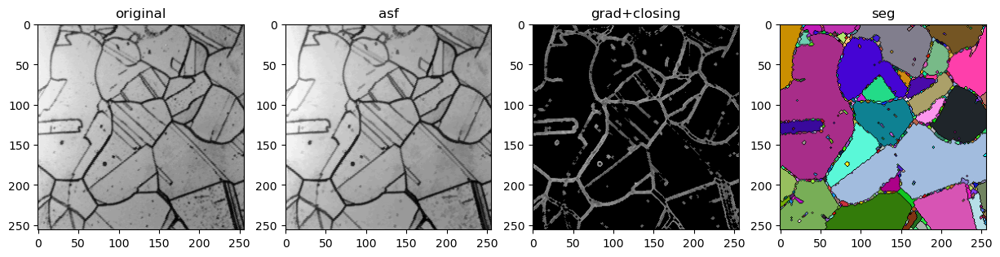

In [113]:
affi=[np.array(Image.open(path+'laiton.bmp'))]
tit =["original"]

im= np.array(Image.open(path+'laiton.bmp'))
    #im=255 -im
s='disk'
fas= np.array(Image.open(path+'laiton.bmp'))
affi=[fas]
tit=["original"]
sizes= np.arange(1,2,1)
seL = [ strel( s ,i ) for i in sizes ]
for i,se in enumerate(seL):
    open=morpho.opening(fas,se)
    reco_op=morpho.reconstruction(open,fas)
    fas=morpho.closing(reco_op,se)
    fas=morpho.reconstruction(fas,reco_op,method='erosion')

affi.append(fas)
tit.append(f"asf")


se=morpho.disk(1)

grad=morpho.dilation(im,se)-morpho.erosion(im,se)

grad=np.int32(grad>11)*grad # thresholding

grad= morpho.closing(grad,morpho.disk(1))
affi.append(grad)
tit.append(f"grad+closing")
local_mini = skf.peak_local_max(255-grad,indices=False) #il n'y a pas de fonction local_min...
markers = ndi.label(local_mini)[0]

labels = watershed(grad, markers,watershed_line=True)

seg=couleurs_alea(labels)
affi.append(seg)
tit.append(f"seg")

niceDisplay14_bis(affi,tit)